# BM-BronchoLC landmark and finding detection - YOLO11
Train a separate 18-class detector on both local `Lung_cancer` and `Non_lung_cancer` folders. The inspected files contain **2,606 images and 6,225 polygons**. Classes include trachea, main carina, main/lobar bronchi, vocal cords, and abnormal findings. Names retain the source spelling.

Polygons become enclosing bounding boxes, matching the UAAL detection workflow. A polygon with multiple labels produces one box per label. Cohort folder names are not detection classes. This notebook does not train a segmentation model.

Run in order. Source data stays read only; converted images, split manifests, weights and results go to `Bronchoscopy/bm_broncholc_outputs`. Training starts only when you execute section 5. The split is created here, not an official benchmark split.

## 1. Setup

In [1]:
%pip install "ultralytics>=8.3,<9" pandas matplotlib pillow pyyaml scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [5]:
import json
import math
import random
import re
import shutil
import hashlib
import warnings
from pathlib import Path
from collections import Counter, defaultdict
from datetime import datetime
import importlib.metadata

import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from PIL import Image
import yaml
import torch
from IPython.display import display

SEED = 42
random.seed(SEED)
torch.manual_seed(SEED)
DATA_ROOT = Path(r"C:\Users\Omen Max\Datasets\Bronchoscopic Datasets\BM-BronchoLC")
HERE = Path.cwd().resolve()
PROJECT_DIR = HERE if HERE.name.lower() == "bronchoscopy" else HERE / "Bronchoscopy"
assert PROJECT_DIR.is_dir(), "Start the kernel from the repository root or Bronchoscopy folder."
OUTPUT_ROOT = PROJECT_DIR / "bm_broncholc_outputs"
OUTPUT_ROOT.mkdir(parents=True, exist_ok=True)
DEVICE = 0 if torch.cuda.is_available() else "cpu"
print("PyTorch:", torch.__version__, "Device:", DEVICE)
if DEVICE != "cpu":
    print(torch.cuda.get_device_name(0))
    # Test actual CUDA execution, not just device discovery.
    print("CUDA check:", (torch.ones(2, device="cuda") + 1).tolist())
else:
    warnings.warn("CUDA unavailable: full training on CPU will be slow.")

PyTorch: 2.11.0+cu128 Device: 0
NVIDIA GeForce RTX 5070 Ti Laptop GPU
CUDA check: [2.0, 2.0]


## 2. Read polygons, labels and subject/video membership
Image UUIDs join `annotation.json` to images. `objects.json` provides subject-object - video - image membership. Subject objects sharing a study ID, video ID, or identical image bytes are joined before splitting. This protects against known overlap; identifiers alone cannot rule out all unrecorded patient overlap.

Missing images, unknown labels and ambiguous memberships stop preparation. Images containing zero-area or entirely outside-image polygons are excluded in full and recorded in `excluded_images.json`, so a rejected positive region is not used as background. One such image was found in the local files. Multi-label polygons remain multi-label boxes. Completely unannotated images, if present, receive empty label files and are counted explicitly.

In [6]:
from sklearn.model_selection import GroupShuffleSplit

cohorts = ["Lung_cancer", "Non_lung_cancer"]
label_map = {}
records = []
annotations_by_image = defaultdict(list)
fingerprint = hashlib.sha256(b"bm-broncholc-boxes-v1-seed42-group80-10-10")
fingerprint.update(str(DATA_ROOT.resolve()).encode())
for cohort in cohorts:
    root = DATA_ROOT / cohort / cohort
    documents = {}
    for filename in ["labels.json", "objects.json", "annotation.json"]:
        contents = (root / filename).read_bytes()
        fingerprint.update(contents)
        documents[filename] = json.loads(contents)
    for label in documents["labels.json"]:
        assert label["annotation_type"] == "POLYGON", label
        assert label["id"] not in label_map or label_map[label["id"]] == label["name"]
        label_map[label["id"]] = label["name"]
    membership = {}
    for subject in documents["objects.json"]:
        for video in subject["videos"]:
            for image in video["images"]:
                identity = (subject["id"], video["video_id"])
                assert image["image_id"] not in membership or membership[image["image_id"]] == identity
                membership[image["image_id"]] = identity
    files = sorted(p for p in (root / "imgs").rglob("*") if p.suffix.lower() in {".jpg", ".jpeg", ".png"})
    assert len({p.stem for p in files}) == len(files), "Duplicate image UUIDs"
    assert {p.stem for p in files} == set(membership), "Image/objects.json mismatch"
    for annotation in documents["annotation.json"]:
        assert annotation["object_id"] in membership
        assert annotation["label_ids"] and set(annotation["label_ids"]) <= set(label_map)
        key = cohort + "/" + annotation["object_id"]
        annotations_by_image[key].append(annotation)
    for path in files:
        subject_id, video_id = membership[path.stem]
        key = cohort + "/" + path.stem
        with Image.open(path) as image:
            width, height = image.size
            assert image.getexif().get(274, 1) == 1, "EXIF rotation requires explicit coordinate handling"
        with Image.open(path) as image:
            image.verify()
        digest = hashlib.sha256(path.read_bytes()).hexdigest()
        fingerprint.update((key + digest).encode())
        records.append(dict(key=key, image_id=path.stem, cohort=cohort,
            subject_id=subject_id, video_id=video_id, path=str(path), width=width, height=height,
            sha256=digest, studies=sorted({a["study_id"] for a in annotations_by_image[key]})))

names = dict(enumerate(sorted(set(label_map.values()))))
name_to_id = {name: index for index, name in names.items()}
label_to_id = {label_id: name_to_id[name] for label_id, name in label_map.items()}
boxes = {}
clipped_polygons = 0
excluded_images = []
for record in records:
    rows = []
    width, height = record["width"], record["height"]
    for annotation in annotations_by_image[record["key"]]:
        points = annotation["data"]
        assert len(points) >= 3, annotation["finding_id"]
        xs, ys = [float(p["x"]) for p in points], [float(p["y"]) for p in points]
        assert all(math.isfinite(v) for v in xs + ys)
        x1, y1 = max(0., min(xs)), max(0., min(ys))
        x2, y2 = min(float(width), max(xs)), min(float(height), max(ys))
        if x2 <= x1 or y2 <= y1:
            excluded_images.append({"image_key": record["key"], "finding_id": annotation["finding_id"],
                                    "reason": "zero-area or outside-image polygon"})
            continue
        clipped_polygons += int((x1, y1, x2, y2) != (min(xs), min(ys), max(xs), max(ys)))
        for label_id in dict.fromkeys(annotation["label_ids"]):
            rows.append((label_to_id[label_id], x1, y1, x2, y2))
    boxes[record["key"]] = rows
excluded_keys = {r["image_key"] for r in excluded_images}
records = [r for r in records if r["key"] not in excluded_keys]
boxes = {key: value for key, value in boxes.items() if key not in excluded_keys}
if excluded_images:
    warnings.warn(f"Excluded {len(excluded_keys)} entire images with invalid polygons; see excluded_images.json.")
print(f"{len(records):,} images; {len(names)} classes; {sum(map(len, boxes.values())):,} labeled boxes")
print("Clipped polygons:", clipped_polygons, "Unannotated images:", sum(not v for v in boxes.values()))

2,605 images; 18 classes; 6,424 labeled boxes
Clipped polygons: 66 Unannotated images: 0


C:\Users\Omen Max\AppData\Local\Temp\ipykernel_20752\1856349386.py:77: UserWarning: Excluded 1 entire images with invalid polygons; see excluded_images.json.
  warnings.warn(f"Excluded {len(excluded_keys)} entire images with invalid polygons; see excluded_images.json.")


## 3. Create and audit grouped train / validation / test splits
Target proportions are 80/10/10 of groups; image proportions differ because groups have different sizes. Starting from the fixed seed, the first grouped split covering all 18 classes in each partition is selected (up to 500 attempts). This uses annotation presence only, never model performance. The chosen seed is saved, and class counts below show remaining imbalance. Test data is reserved for final evaluation, while validation chooses checkpoints.

In [7]:
# Union-find merges any subject groups connected by study, video, or exact image duplicates.
parent = {r["subject_id"]: r["subject_id"] for r in records}
def find(x):
    while parent[x] != x:
        parent[x] = parent[parent[x]]
        x = parent[x]
    return x
def union(a, b):
    parent[find(b)] = find(a)
seen = {}
for record in records:
    tokens = [("video", record["video_id"]), ("bytes", record["sha256"])]
    tokens += [("study", study) for study in record["studies"]]
    for token in tokens:
        if token in seen:
            union(record["subject_id"], seen[token])
        else:
            seen[token] = record["subject_id"]
for record in records:
    record["group"] = find(record["subject_id"])
frame = pd.DataFrame(records)
# Choose the first deterministic grouped split covering all classes in each partition.
# Only annotation coverage is used here, never model predictions or test metrics.
image_classes = {r["key"]: {box[0] for box in boxes[r["key"]]} for r in records}
def covers_all(indices):
    return set().union(*(image_classes[key] for key in frame.iloc[indices]["key"])) == set(names)
for split_attempt in range(500):
    split_seed = SEED + split_attempt
    train_idx, remaining_idx = next(GroupShuffleSplit(n_splits=1, test_size=0.2, random_state=split_seed).split(frame, groups=frame.group))
    remaining = frame.iloc[remaining_idx]
    v, t = next(GroupShuffleSplit(n_splits=1, test_size=0.5, random_state=split_seed).split(remaining, groups=remaining.group))
    val_idx, test_idx = remaining_idx[v], remaining_idx[t]
    if all(covers_all(indices) for indices in [train_idx, val_idx, test_idx]):
        break
else:
    raise ValueError("Cannot cover all classes with grouped 80/10/10 splits in 500 attempts. Review rare-class group counts before changing proportions.")
frame["split"] = "train"
frame.loc[val_idx, "split"] = "val"
frame.loc[test_idx, "split"] = "test"
print("Split seed:", split_seed, "(all classes represented in each split)")
for field in ["subject_id", "video_id", "sha256", "group"]:
    assert frame.groupby(field)["split"].nunique().max() == 1, f"Split overlap: {field}"
study_splits = defaultdict(set)
for row in frame.to_dict("records"):
    for study in row["studies"]:
        study_splits[study].add(row["split"])
assert all(len(s) == 1 for s in study_splits.values())
split_records = {split: frame[frame.split == split].to_dict("records") for split in ["train", "val", "test"]}
class_counts = {split: Counter(b[0] for r in rows for b in boxes[r["key"]]) for split, rows in split_records.items()}
class_table = pd.DataFrame([{"yolo_id": i, "class": name,
    **{f"{split}_boxes": class_counts[split][i] for split in split_records}} for i, name in names.items()])
display(frame.groupby(["split", "cohort"]).agg(images=("key", "size"), groups=("group", "nunique")))
display(class_table)
if (class_table[["train_boxes", "val_boxes", "test_boxes"]] == 0).any().any():
    warnings.warn("Some classes are absent from a split. Inspect class_table before interpreting metrics.")
fingerprint.update(frame[["key", "split", "group"]].to_csv(index=False).encode())
YOLO_ROOT = OUTPUT_ROOT / f"dataset_{fingerprint.hexdigest()[:12]}"
YOLO_ROOT.mkdir(parents=True, exist_ok=True)
frame.to_json(YOLO_ROOT / "split_manifest.json", orient="records", indent=2)
class_table.to_csv(YOLO_ROOT / "class_counts.csv", index=False)
(YOLO_ROOT / "excluded_images.json").write_text(json.dumps(excluded_images, indent=2))

(YOLO_ROOT / "split_config.json").write_text(json.dumps({"base_seed": SEED, "selected_seed": split_seed, "selection": "first grouped split covering all classes", "group_proportions": [0.8, 0.1, 0.1]}, indent=2))


Split seed: 44 (all classes represented in each split)


images  groups
split cohort                         
test  Lung_cancer         164      12
      Non_lung_cancer     124       9
train Lung_cancer        1043      83
      Non_lung_cancer    1044      82
val   Lung_cancer         141      11
      Non_lung_cancer      89      10

,yolo_id,class,train_boxes,val_boxes,test_boxes
0,0,Anthrocosis,48,15,4
1,1,Intermediate bronchus,239,19,36
2,2,Left inferior lobar bronchus,422,58,63
3,3,Left main bronchus,551,45,73
4,4,Left superior lobar bronchus,316,38,45
5,5,Main carina,445,40,58
6,6,Mucosal edema of carina,147,18,21
7,7,Mucosal infiltration,451,46,49
8,8,Muscosal erythema,74,10,18
9,9,Right inferior lobar bronchus,368,31,61


159

## 4. Convert to YOLO boxes and inspect labels
Copies images into the generated dataset; valid cached copies are reused. Every class/region pair is retained, including overlapping classes. All normalized coordinates are checked. The preview defaults to lower-airway anatomy and can display either validation or test images.

In [8]:
for split, rows in split_records.items():
    image_dir, label_dir = YOLO_ROOT / "images" / split, YOLO_ROOT / "labels" / split
    image_dir.mkdir(parents=True, exist_ok=True)
    label_dir.mkdir(parents=True, exist_ok=True)
    for row in rows:
        source = Path(row["path"])
        stem = row["cohort"] + "_" + row["image_id"]
        destination = image_dir / (stem + source.suffix.lower())
        if not destination.exists() or hashlib.sha256(destination.read_bytes()).hexdigest() != row["sha256"]:
            shutil.copy2(source, destination)
        row["converted_path"] = str(destination)
        lines = []
        for cls, x1, y1, x2, y2 in boxes[row["key"]]:
            coords = ((x1+x2)/(2*row["width"]), (y1+y2)/(2*row["height"]),
                      (x2-x1)/row["width"], (y2-y1)/row["height"])
            assert all(0 <= value <= 1 for value in coords)
            lines.append(str(cls) + " " + " ".join(f"{v:.8f}" for v in coords))
        (label_dir / f"{stem}.txt").write_text("\n".join(lines) + ("\n" if lines else ""))
DATA_YAML = YOLO_ROOT / "data.yaml"
DATA_YAML.write_text(yaml.safe_dump({"path": YOLO_ROOT.as_posix(),
    **{s: f"images/{s}" for s in split_records}, "names": names}, sort_keys=False))
print(DATA_YAML)

C:\Users\Omen Max\Marina\Nebras_RandD\Bronchoscopy\bm_broncholc_outputs\dataset_e42843bdb245\data.yaml


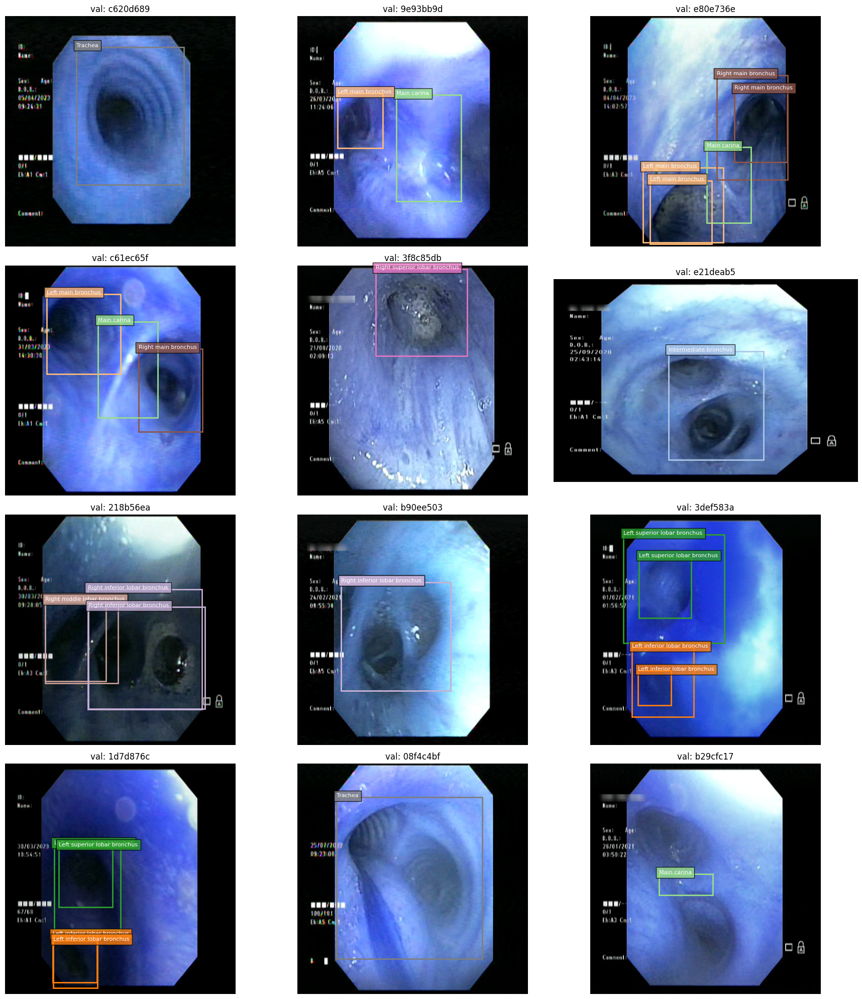

In [9]:
PREVIEW_SPLIT = "val"  # Change to "test" after model selection.
FOCUS_CLASSES = ["Trachea", "Main carina", "Right main bronchus", "Left main bronchus",
                 "Right superior lobar bronchus", "Intermediate bronchus",
                 "Right middle lobar bronchus", "Right inferior lobar bronchus",
                 "Left superior lobar bronchus", "Left inferior lobar bronchus"]
N_PREVIEW = 12

def select_preview(split, focus_classes, count):
    assert split in split_records and count > 0
    assert focus_classes and not set(focus_classes) - set(name_to_id)
    rng = random.Random(SEED)
    pools = []
    for name in focus_classes:
        pool = [r for r in split_records[split] if any(b[0] == name_to_id[name] for b in boxes[r["key"]])]
        rng.shuffle(pool)
        pools.append(pool)
    selected, used = [], set()
    while len(selected) < count:
        added = False
        for pool in pools:
            while pool and pool[-1]["key"] in used:
                pool.pop()
            if pool and len(selected) < count:
                row = pool.pop()
                selected.append(row); used.add(row["key"]); added = True
        if not added:
            break
    assert selected, "No matching labeled images in this split."
    return selected

def draw_ground_truth(ax, row, focus_classes):
    with Image.open(row["path"]) as image:
        ax.imshow(image.convert("RGB"))
    for cls, x1, y1, x2, y2 in boxes[row["key"]]:
        if names[cls] not in focus_classes:
            continue
        color = plt.get_cmap("tab20")(cls)
        ax.add_patch(Rectangle((x1,y1), x2-x1, y2-y1, fill=False, edgecolor=color, linewidth=2))
        ax.text(x1,y1,names[cls],fontsize=8,color="white",bbox={"facecolor":color,"alpha":0.8})
    ax.axis("off")

preview = select_preview(PREVIEW_SPLIT, FOCUS_CLASSES, N_PREVIEW)
fig, axes = plt.subplots(math.ceil(len(preview)/3), 3, figsize=(18, 5*math.ceil(len(preview)/3)), squeeze=False)
for ax, row in zip(axes.flat, preview):
    draw_ground_truth(ax, row, FOCUS_CLASSES)
    ax.set_title(f"{PREVIEW_SPLIT}: {row['image_id'][:8]}")
for ax in axes.flat:
    ax.axis("off")
plt.tight_layout(); plt.show(); plt.close(fig)

## 5. Train the 18-class detector
YOLO11s, 100 epochs, batch 8, 640-pixel inputs. Use `SMOKE_TEST=True` for a one-epoch pipeline check. Flips are disabled to preserve left/right anatomy; mosaic and mixup are disabled. `workers=0` supports Windows notebooks. Resume interrupted training using `RESUME_FROM`.

This trains bounding boxes from the polygon annotations. Same-region class pairs can overlap; inference keeps class-aware NMS. Training has not been run as part of creating this notebook.

In [7]:
from ultralytics import YOLO

MODEL = "yolo11s.pt"
EPOCHS = 100
IMGSZ = 640
BATCH = 8
SMOKE_TEST = False
RESUME_FROM = None  # e.g. OUTPUT_ROOT / "runs" / "bm_broncholc_..." / "weights" / "last.pt"

if RESUME_FROM is not None:
    assert Path(RESUME_FROM).is_file(), RESUME_FROM
    model = YOLO(str(RESUME_FROM))
    train_results = model.train(resume=True, device=DEVICE, workers=0)
else:
    run_name = ("smoke_" if SMOKE_TEST else "bm_broncholc_") + datetime.now().strftime("%Y%m%d_%H%M%S_%f")
    model = YOLO(MODEL)
    train_results = model.train(
        data=str(DATA_YAML), epochs=1 if SMOKE_TEST else EPOCHS,
        fraction=0.05 if SMOKE_TEST else 1.0, imgsz=IMGSZ, batch=BATCH,
        device=DEVICE, workers=0, seed=SEED, deterministic=True,
        optimizer="AdamW", lr0=0.001, weight_decay=0.0005,
        patience=20, amp=DEVICE != "cpu", cache=False,
        fliplr=0.0, flipud=0.0, degrees=5.0, translate=0.05, scale=0.15,
        shear=0.0, perspective=0.0, mosaic=0.0, mixup=0.0,
        hsv_h=0.01, hsv_s=0.2, hsv_v=0.2,
        project=str(OUTPUT_ROOT / "runs"), name=run_name,
        save=True, plots=True, exist_ok=False,
    )
RUN_DIR = Path(model.trainer.save_dir)
BEST_WEIGHTS = RUN_DIR / "weights" / "best.pt"
assert BEST_WEIGHTS.is_file(), BEST_WEIGHTS
versions = {p: importlib.metadata.version(p) for p in ["torch", "torchvision", "ultralytics", "numpy", "pandas", "pillow"]}
(RUN_DIR / "environment.json").write_text(json.dumps(versions, indent=2), encoding="utf-8")
print("Best checkpoint:", BEST_WEIGHTS)
(RUN_DIR / "dataset_metadata.json").write_text(json.dumps({"source": str(DATA_ROOT), "fingerprint": fingerprint.hexdigest(), "class_names": names, "split_manifest": str(YOLO_ROOT / "split_manifest.json")}, indent=2))

New https://pypi.org/project/ultralytics/8.4.143 available  Update with 'pip install -U ultralytics'
Ultralytics 8.4.142  Python-3.10.8 torch-2.11.0+cu128 CUDA:0 (NVIDIA GeForce RTX 5070 Ti Laptop GPU, 12227MiB)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=C:\Users\Omen Max\Marina\Nebras_RandD\Bronchoscopy\bm_broncholc_outputs\dataset_e42843bdb245\data.yaml, degrees=5.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.0, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.01, hsv_s=0.2, hsv_v=0.2, imgsz=640, iou=0.7, keras=False, kobj=1.0, l

906

## 6. Evaluate validation and held-out test sets
Validation selects `best.pt`; test evaluates the selected model once. Per-class precision, recall, AP50 and AP50?95 are saved separately. Classes without ground truth remain NaN. Do not tune thresholds or training choices against test performance. For a fresh kernel, run setup/preparation, set `BEST_WEIGHTS` and `RUN_DIR` to an existing run, and skip the training cell.

Ultralytics 8.4.142  Python-3.10.8 torch-2.11.0+cu128 CUDA:0 (NVIDIA GeForce RTX 5070 Ti Laptop GPU, 12227MiB)
YOLO11s summary (fused): 100 layers, 9,419,766 parameters, 0 gradients, 21.5 GFLOPs
val: Fast image access  (ping: 0.00.0 ms, read: 2574.4423.8 MB/s, size: 198.6 KB)
val: Scanning C:\Users\Omen Max\Marina\Nebras_RandD\Bronchoscopy\bm_broncholc_outputs\dataset_e42843bdb245\labels\val.cache... 230 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 230/230  0.0s
val: C:\Users\Omen Max\Marina\Nebras_RandD\Bronchoscopy\bm_broncholc_outputs\dataset_e42843bdb245\images\val\Lung_cancer_06318142-57b9-4879-9c9a-b9755893806c.png: 2 duplicate labels removed
val: C:\Users\Omen Max\Marina\Nebras_RandD\Bronchoscopy\bm_broncholc_outputs\dataset_e42843bdb245\images\val\Lung_cancer_4446cbe1-4289-4ac6-bdaf-c92ff968e1cb.png: 1 duplicate labels removed
val: C:\Users\Omen Max\Marina\Nebras_RandD\Bronchoscopy\bm_broncholc_outputs\dataset_e42843bdb245\images\val\Lung_cancer_52354faa-12ca-499b-b4a5-7

,yolo_id,class,train_boxes,val_boxes,test_boxes,precision,recall,AP50,AP50_95,status
0,0,Anthrocosis,48,15,4,0.000000,0.000000,0.002655,0.000554,evaluated
1,1,Intermediate bronchus,239,19,36,0.648994,0.616595,0.653698,0.316145,evaluated
2,2,Left inferior lobar bronchus,422,58,63,0.503547,0.269215,0.378334,0.183683,evaluated
3,3,Left main bronchus,551,45,73,0.446269,0.595238,0.473279,0.196501,evaluated
4,4,Left superior lobar bronchus,316,38,45,0.494079,0.696970,0.640654,0.319803,evaluated
5,5,Main carina,445,40,58,0.504456,0.378378,0.349862,0.115069,evaluated
6,6,Mucosal edema of carina,147,18,21,1.000000,0.000000,0.103354,0.037340,evaluated
7,7,Mucosal infiltration,451,46,49,0.121330,0.047619,0.075631,0.029090,evaluated
8,8,Muscosal erythema,74,10,18,1.000000,0.000000,0.001626,0.000606,evaluated
9,9,Right inferior lobar bronchus,368,31,61,0.444421,0.615385,0.417547,0.221728,evaluated


Ultralytics 8.4.142  Python-3.10.8 torch-2.11.0+cu128 CUDA:0 (NVIDIA GeForce RTX 5070 Ti Laptop GPU, 12227MiB)
YOLO11s summary (fused): 100 layers, 9,419,766 parameters, 0 gradients, 21.5 GFLOPs
val: Fast image access  (ping: 0.00.0 ms, read: 2281.9499.0 MB/s, size: 212.2 KB)
val: Scanning C:\Users\Omen Max\Marina\Nebras_RandD\Bronchoscopy\bm_broncholc_outputs\dataset_e42843bdb245\labels\test... 288 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 288/288 2.0Kit/s 0.1s<0.3s
val: C:\Users\Omen Max\Marina\Nebras_RandD\Bronchoscopy\bm_broncholc_outputs\dataset_e42843bdb245\images\test\Lung_cancer_09d02a3c-60b1-4ecc-b283-4337c09c5a00.png: 1 duplicate labels removed
val: C:\Users\Omen Max\Marina\Nebras_RandD\Bronchoscopy\bm_broncholc_outputs\dataset_e42843bdb245\images\test\Non_lung_cancer_447b9875-a165-4168-a0c3-ae6c0d73bbd0.png: 2 duplicate labels removed
val: C:\Users\Omen Max\Marina\Nebras_RandD\Bronchoscopy\bm_broncholc_outputs\dataset_e42843bdb245\images\test\Non_lung_cancer_47b6e8

,yolo_id,class,train_boxes,val_boxes,test_boxes,precision,recall,AP50,AP50_95,status
0,0,Anthrocosis,48,15,4,0.000000,0.000000,0.004406,0.002164,evaluated
1,1,Intermediate bronchus,239,19,36,0.588066,0.500000,0.558569,0.288675,evaluated
2,2,Left inferior lobar bronchus,422,58,63,0.488490,0.406780,0.440143,0.225331,evaluated
3,3,Left main bronchus,551,45,73,0.479912,0.695410,0.608795,0.307456,evaluated
4,4,Left superior lobar bronchus,316,38,45,0.450928,0.577778,0.473992,0.198006,evaluated
5,5,Main carina,445,40,58,0.400427,0.518519,0.399588,0.132950,evaluated
6,6,Mucosal edema of carina,147,18,21,0.315062,0.190476,0.161047,0.044922,evaluated
7,7,Mucosal infiltration,451,46,49,0.303871,0.061224,0.148928,0.042350,evaluated
8,8,Muscosal erythema,74,10,18,1.000000,0.000000,0.016685,0.003680,evaluated
9,9,Right inferior lobar bronchus,368,31,61,0.354181,0.491228,0.394237,0.221853,evaluated


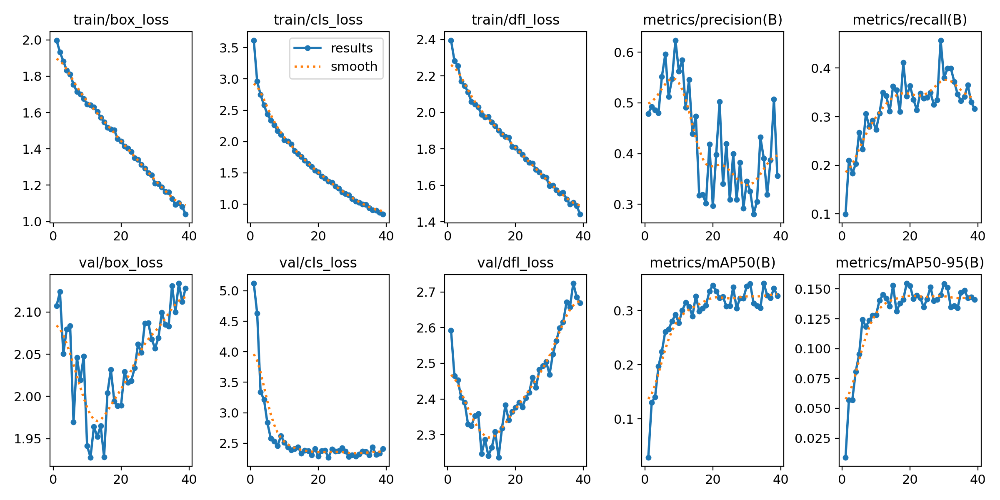

In [8]:
best = YOLO(str(BEST_WEIGHTS))
evaluations = {}
for split in ["val", "test"]:
    metrics = best.val(data=str(DATA_YAML), split=split, imgsz=IMGSZ, batch=BATCH,
        device=DEVICE, workers=0, plots=True, project=str(RUN_DIR), name=f"{split}_evaluation", exist_ok=False)
    evaluations[split] = metrics
    table = class_table.copy()
    for column in ["precision", "recall", "AP50", "AP50_95"]:
        table[column] = float("nan")
    for index, class_id in enumerate(metrics.box.ap_class_index):
        table.loc[table.yolo_id == int(class_id), ["precision", "recall", "AP50", "AP50_95"]] = metrics.box.class_result(index)
    table["status"] = table.apply(lambda r: "no training examples" if r.train_boxes == 0 else
        ("no evaluation examples" if r[f"{split}_boxes"] == 0 else "evaluated"), axis=1)
    table.to_csv(RUN_DIR / f"{split}_per_class_metrics.csv", index=False)
    (RUN_DIR / f"{split}_metrics.json").write_text(json.dumps({k:float(v) for k,v in metrics.results_dict.items()}, indent=2))
    print(split, "mAP50:", metrics.box.map50, "mAP50-95:", metrics.box.map)
    display(table)
if (RUN_DIR / "results.png").exists():
    display(Image.open(RUN_DIR / "results.png"))

## 7. Compare lower-airway labels with predictions
Set `PREVIEW_SPLIT` to `val` or `test`, and edit `FOCUS_CLASSES` above to include findings such as Tumor or Stenosis. Sampling uses ground truth, so it illustrates requested classes rather than estimating representative accuracy. Only focused classes are drawn; evaluation above includes all classes.

In [17]:
from pathlib import Path
from ultralytics import YOLO

RUN_DIR = OUTPUT_ROOT / "runs" / "bm_broncholc_20260908_103912_734354"
BEST_WEIGHTS = RUN_DIR / "weights" / "best.pt"
assert BEST_WEIGHTS.is_file(), f"Checkpoint not found: {BEST_WEIGHTS}"

IMGSZ = 640
best = YOLO(str(BEST_WEIGHTS))


0: 640x640 (no detections), 3.2ms
1: 640x640 (no detections), 3.2ms
2: 640x640 1 Right main bronchus, 3.2ms
3: 640x640 1 Left main bronchus, 3.2ms
4: 640x640 (no detections), 3.2ms
5: 640x640 1 Right inferior lobar bronchus, 3.2ms
6: 640x640 (no detections), 3.2ms
7: 640x640 (no detections), 3.2ms
8: 640x640 1 Left superior lobar bronchus, 3.2ms
9: 640x640 2 Left superior lobar bronchuss, 3.2ms
10: 640x640 1 Left main bronchus, 3.2ms
11: 640x640 (no detections), 3.2ms


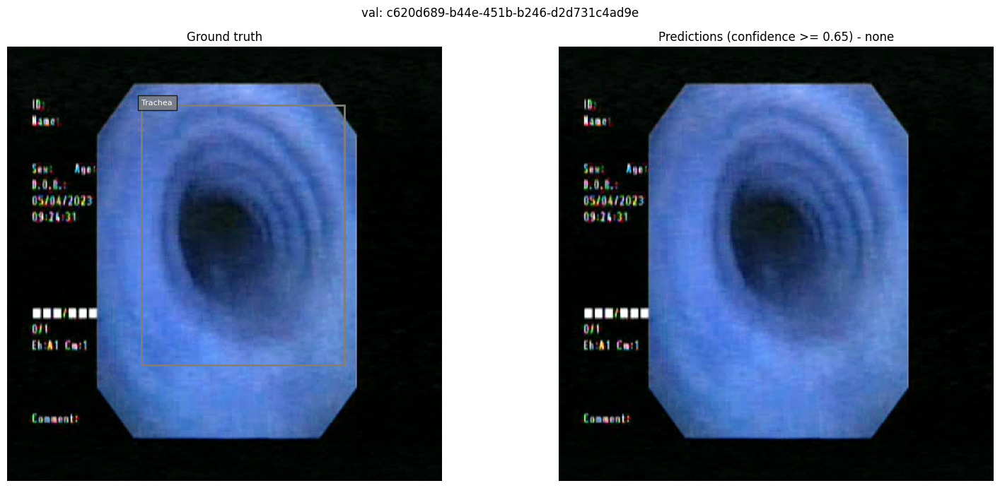

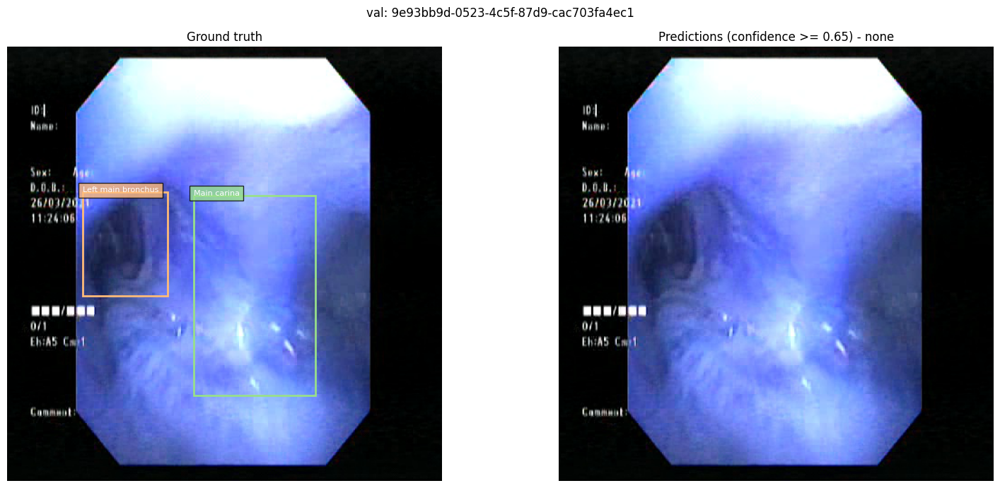

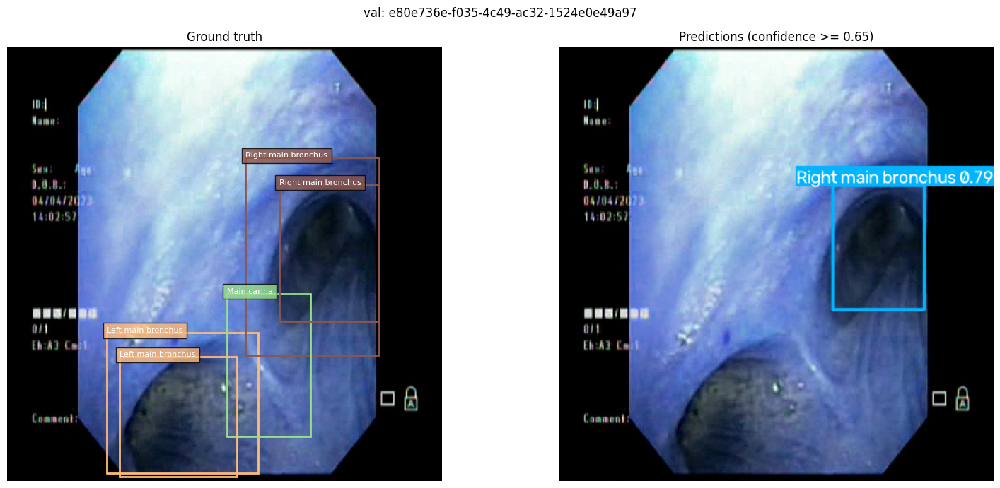

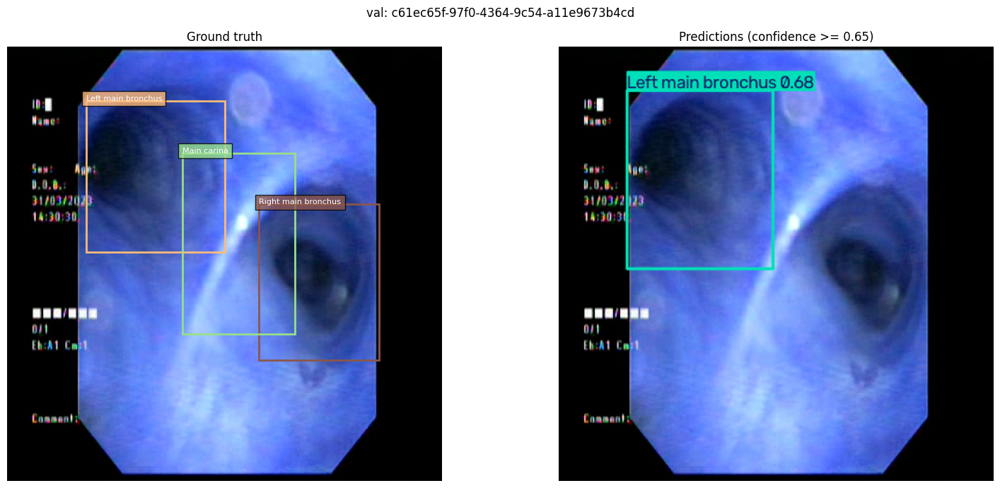

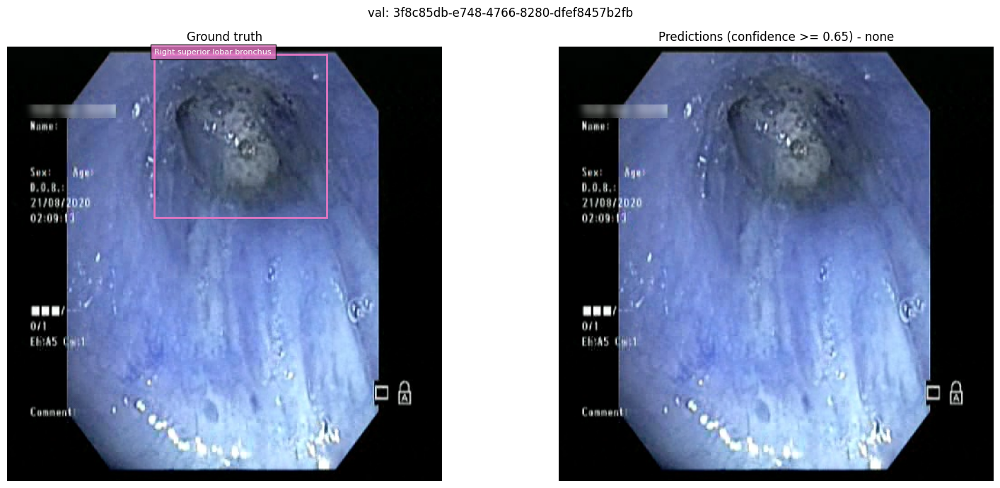

...

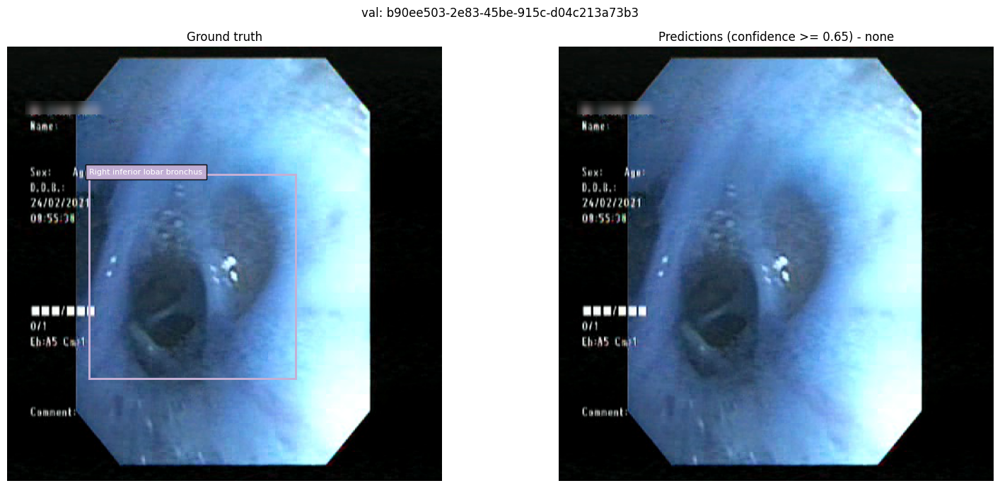

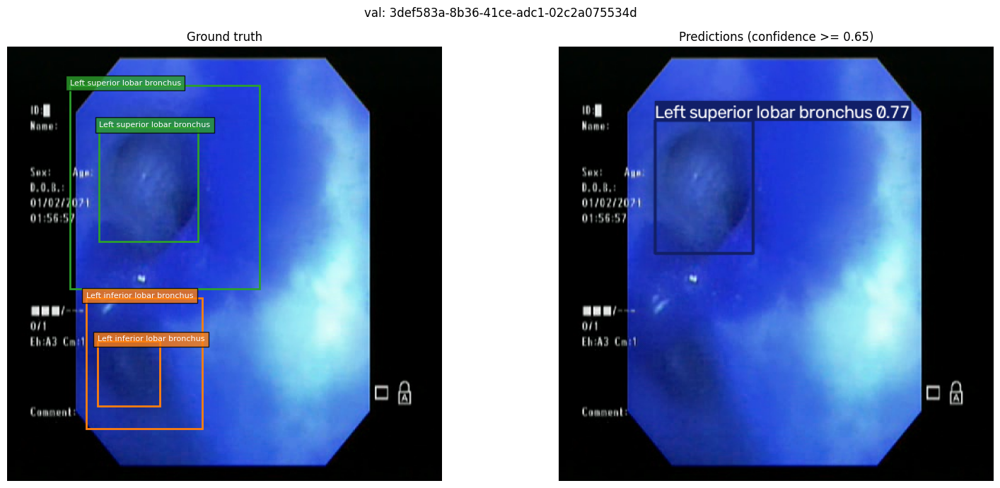

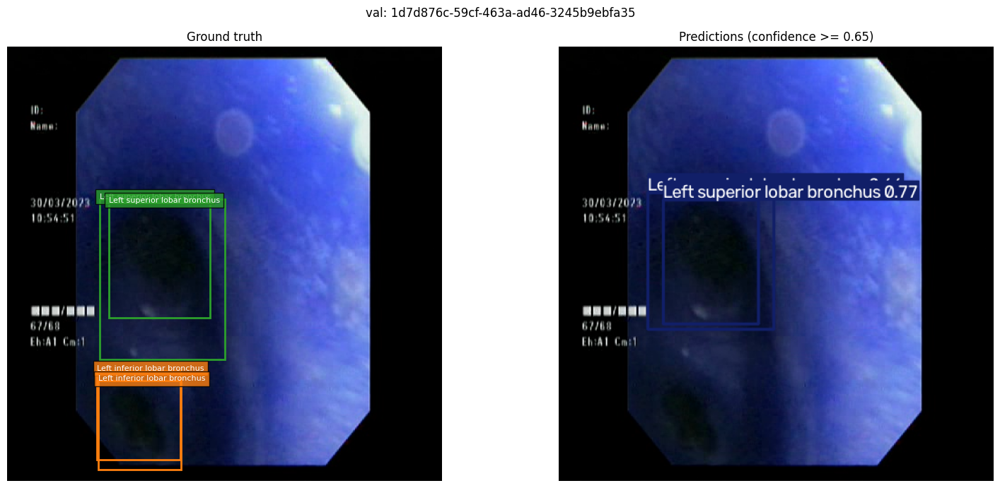

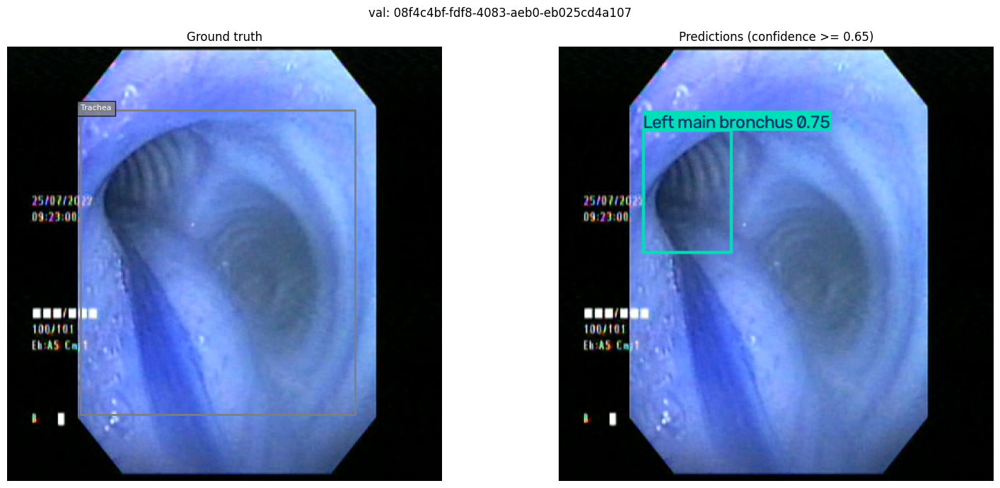

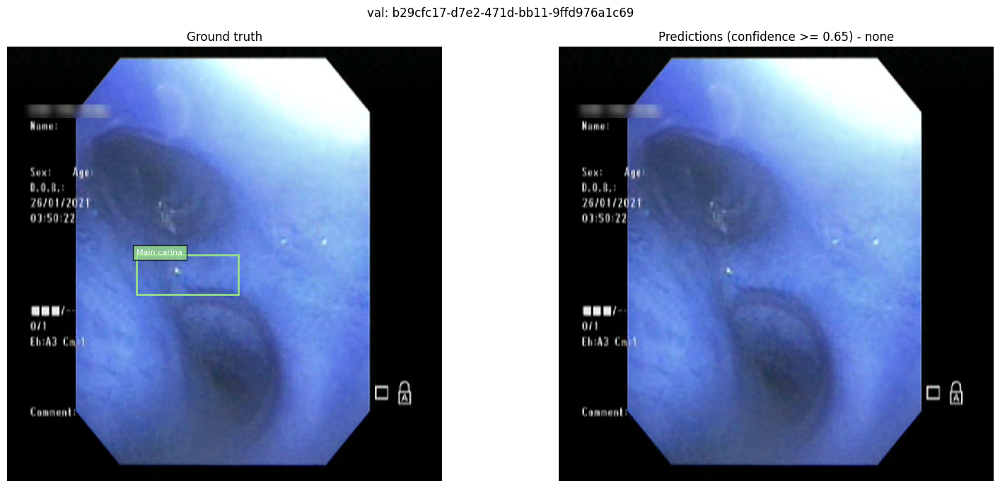

Artifacts: C:\Users\Omen Max\Marina\Nebras_RandD\Bronchoscopy\bm_broncholc_outputs\runs\bm_broncholc_20260908_103912_734354


In [18]:
preview = select_preview(PREVIEW_SPLIT, FOCUS_CLASSES, N_PREVIEW)
results = best.predict(source=[r["converted_path"] for r in preview], imgsz=IMGSZ,
    conf=0.65, classes=[name_to_id[n] for n in FOCUS_CLASSES], agnostic_nms=False,
    device=DEVICE, stream=True, save=True, project=str(RUN_DIR), name=f"{PREVIEW_SPLIT}_focused_predictions")
try:
    for row, result in zip(preview, results):
        fig, axes = plt.subplots(1, 2, figsize=(16, 7))
        draw_ground_truth(axes[0], row, FOCUS_CLASSES)
        axes[0].set_title("Ground truth")
        axes[1].imshow(result.plot()[..., ::-1]); axes[1].axis("off")
        axes[1].set_title("Predictions (confidence >= 0.65)" + (" - none" if len(result.boxes) == 0 else ""))
        fig.suptitle(f"{PREVIEW_SPLIT}: {row['image_id']}")
        plt.tight_layout(); plt.show(); plt.close(fig)
finally:
    results.close()
print("Artifacts:", RUN_DIR)